# APAC NWP Forecast Archive — Colab 驗證（記憶體輕量版）
從 Hugging Face 讀取 [JimTseng/apac-nwp-forecast-archive](https://huggingface.co/datasets/JimTseng/apac-nwp-forecast-archive)。
**設計原則**：統計與單點查詢用 DuckDB 遠端查詢（不載入整檔），只有 GIF 載入單一模型的必要欄位——
免費版 Colab（~12.7GB RAM）可順利執行。

In [1]:
!pip -q install huggingface_hub pyarrow pandas matplotlib pillow duckdb

## 1. 列出 repo 檔案

In [2]:
from huggingface_hub import HfApi
api = HfApi()
REPO = "JimTseng/apac-nwp-forecast-archive"
files = sorted(f for f in api.list_repo_files(REPO, repo_type="dataset") if f.endswith(".parquet"))
for f in files: print(f)

/Users/wctseng/miniconda3/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


data/model=dwd_icon/year=2026/month=06/20260612T041103Z.parquet
data/model=dwd_icon/year=2026/month=06/20260612T072835Z.parquet
data/model=jma_msm/year=2026/month=06/20260612T072835Z.parquet
data/model=ncep_gfs013/year=2026/month=06/20260612T072835Z.parquet


## 2. 各模型概況（DuckDB 遠端查詢，不佔 RAM）

In [3]:
import duckdb
con = duckdb.connect()
BASE = f"hf://datasets/{REPO}/data"
MODELS = ["dwd_icon", "ncep_gfs013", "jma_msm"]
for m in MODELS:
    r = con.sql(f'''
      SELECT count(*) AS rows, count(DISTINCT location_id) AS points,
             min(time) AS t_min, max(time) AS t_max,
             round(min(latitude),1) AS lat_min, round(max(latitude),1) AS lat_max
      FROM '{BASE}/model={m}/year=*/month=*/*.parquet'
    ''').fetchone()
    print(f"{m:14} {r[1]:>8,} 點  {r[0]:>12,} 列  lat {r[4]}~{r[5]}  time {r[2]} ~ {r[3]}")

dwd_icon        120,399 點    46,233,216 列  lat -43.599998474121094~46.0  time 2026-06-12 00:00:00 ~ 2026-06-19 23:00:00


ncep_gfs013     136,557 點    26,218,944 列  lat -43.599998474121094~46.0  time 2026-06-12 00:00:00 ~ 2026-06-19 23:00:00


jma_msm         227,513 點    21,841,248 列  lat 22.399999618530273~46.0  time 2026-06-12 00:00:00 ~ 2026-06-15 23:00:00


## 3. 變數統計（dwd_icon 最新檔，DuckDB SUMMARIZE）

In [4]:
latest_icon = sorted(f for f in files if "model=dwd_icon" in f)[-1]
summary = con.sql(f'''
  SUMMARIZE SELECT * EXCLUDE (location_id, latitude, longitude, elevation, time)
  FROM 'hf://datasets/{REPO}/{latest_icon}'
''').df()
summary[['column_name','min','max','avg','null_percentage']]

,column_name,min,max,avg,null_percentage
0,shortwave_radiation_wattPerSquareMetre,0.0,1130.0,198.9996494161517,5.73
1,direct_radiation_wattPerSquareMetre,0.0,974.0,115.55295965959226,5.73
2,diffuse_radiation_wattPerSquareMetre,0.0,647.0,83.44668975655944,5.73
3,direct_normal_irradiance_wattPerSquareMetre,0.0,16777.22,186.89693909870485,5.73
4,temperature_2m_celsius,-5.65,45.65,20.73750083138472,5.73
5,relative_humidity_2m_percentage,3.0,100.0,70.17499920499147,5.73
6,wind_speed_10m_metrePerSecond,0.0,16.29,2.5731760767210075,5.73
7,surface_pressure_hectopascal,992.9,1037.7,1013.0924690423542,5.73
8,precipitation_millimetre,0.0,49.5,0.1479028368185731,5.73
9,cloud_cover_percentage,0.0,100.0,72.3061177019192,5.73


## 4. 單點時序：三模型在東京附近的 GHI 比較（DuckDB bbox 查詢）

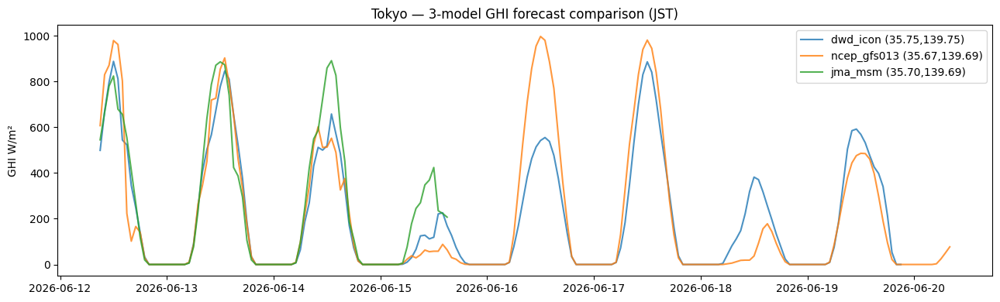

In [5]:
import pandas as pd
import matplotlib.pyplot as plt

ghi = 'shortwave_radiation_wattPerSquareMetre'
site_lat, site_lon = 35.7, 139.7
fig, ax = plt.subplots(figsize=(13, 4))
for m in MODELS:
    d = con.sql(f'''
      SELECT latitude, longitude, time, {ghi} AS ghi
      FROM '{BASE}/model={m}/year=*/month=*/*.parquet'
      WHERE latitude BETWEEN {site_lat}-0.08 AND {site_lat}+0.08
        AND longitude BETWEEN {site_lon}-0.08 AND {site_lon}+0.08
    ''').df()
    d2 = (d.latitude - site_lat)**2 + (d.longitude - site_lon)**2
    p = d[d2 == d2.min()].sort_values('time')
    ax.plot(p.time + pd.Timedelta(hours=9), p.ghi,
            label=f"{m} ({p.latitude.iloc[0]:.2f},{p.longitude.iloc[0]:.2f})", alpha=.8)
ax.set_ylabel('GHI W/m²'); ax.set_title('Tokyo — 3-model GHI forecast comparison (JST)')
ax.legend(); plt.tight_layout(); plt.show()

## 5. GHI 時空動畫（dwd_icon）
只載入 5 個必要欄位（~650MB），是整本 notebook 唯一較吃記憶體的一步。

In [6]:
import numpy as np
from matplotlib.animation import FuncAnimation, PillowWriter

dfa = pd.read_parquet(f"hf://datasets/{REPO}/{latest_icon}",
                      columns=['location_id','latitude','longitude','time', ghi])
valid = dfa.groupby('time')[ghi].apply(lambda s: s.notna().mean())
times = np.sort(valid[valid > 0.95].index.values)
dfa = dfa[dfa.time.isin(times)]
pts = dfa[['location_id','latitude','longitude']].drop_duplicates('location_id').sort_values('location_id')
wide = dfa.pivot(index='location_id', columns='time', values=ghi).loc[pts.location_id]
del dfa
print(f"{len(times)} timesteps, {len(pts):,} points")

fig, ax = plt.subplots(figsize=(7.2, 9.5))
sc = ax.scatter(pts.longitude, pts.latitude, c=wide.iloc[:,0], s=1.0, cmap='inferno', vmin=0, vmax=1000)
plt.colorbar(sc, label='GHI W/m²', shrink=.6)
ax.set_xlabel('lon'); ax.set_ylabel('lat')
title = ax.set_title('GHI\n ')
plt.tight_layout()

def update(i):
    sc.set_array(wide.iloc[:, i].values)
    t = pd.Timestamp(times[i])
    title.set_text(f'GHI  {t:%m-%d %H:%M} UTC\n(TW {t+pd.Timedelta(hours=8):%H:%M} / JP {t+pd.Timedelta(hours=9):%H:%M})')
    return sc, title

anim = FuncAnimation(fig, update, frames=len(times), blit=False)
anim.save('ghi_animation.gif', writer=PillowWriter(fps=10), dpi=66)
plt.close()
print('saved ghi_animation.gif')

181 timesteps, 120,399 points


saved ghi_animation.gif


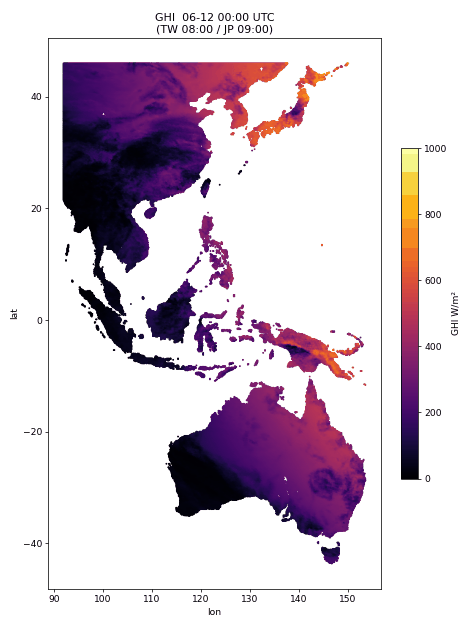

In [7]:
from IPython.display import Image
Image(open('ghi_animation.gif','rb').read())